<a href="https://colab.research.google.com/github/sarafyash/Deep-Neuro-Fuzzy-System-for-Violence-Detection-/blob/main/Capstone_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

---

---

# ***Deep Neuro-Fuzzy System for Violence Detection***

---

---


## ***Importing the necessary libraries***

In [ ]:
import os
import shutil
import cv2
import math
import random
import numpy as np
import datetime as dt
import tensorflow
import pydot
import graphviz
import glob

from collections import deque
import matplotlib.pyplot as plt
plt.style.use("seaborn-v0_8-darkgrid")

%matplotlib inline

from sklearn.model_selection import train_test_split

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import keras

In [ ]:
from keras.layers import *
from keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model

##***Visualize the Data***

In [ ]:
from IPython.display import HTML
from base64 import b64encode

In [ ]:
def Play_Video(filepath):
    html = ''
    video = open(filepath, 'rb').read()
    src = 'data:video/mp4;base64,' + b64encode(video).decode()
    html += '<video width=640 muted controls autoplay loop><source src="%s" type="video/mp4"></video>' % src
    return HTML(html)

In [ ]:
# Classes Directories
NonViolenceVideos_Dir = "/content/drive/MyDrive/Project_Dataset/NonViolence"
ViolenceVideos_Dir =  "/content/drive/MyDrive/Project_Dataset/Violence"

# Retrieve the list of all the video files present in the Class Directory.
NonViolence_files_names_list = os.listdir(NonViolenceVideos_Dir)
Violence_files_names_list = os.listdir(ViolenceVideos_Dir)

# Randomly select a video file from the Classes Directory.
Random_NonViolence_Video = random.choice(NonViolence_files_names_list)
Random_Violence_Video = random.choice(Violence_files_names_list)

In [ ]:
def count_videos_in_directory(directory):
    # Define the file extensions that you consider as video files
    video_extensions = ['.mp4', '.avi', '.mov', '.mkv', '.wmv', '.flv', '.webm']

    # Use glob to get all files with the specified extensions in the directory
    video_files = []
    for ext in video_extensions:
        video_files.extend(glob.glob(os.path.join(directory, f'*{ext}')))

    # Count the number of video files
    num_videos = len(video_files)

    return num_videos

In [ ]:
# Count videos in NonViolenceVideos_Dir
num_non_violence_videos = count_videos_in_directory(NonViolenceVideos_Dir)

# Count videos in ViolenceVideos_Dir
num_violence_videos = count_videos_in_directory(ViolenceVideos_Dir)

print(f'Total number of non-violence videos: {num_non_violence_videos}')
print(f'Total number of violence videos: {num_violence_videos}')

Total number of non-violence videos: 1136
Total number of violence videos: 1000


In [ ]:
Play_Video("/content/drive/MyDrive/Project_Dataset/NonViolence/NV_202.mp4")

In [ ]:
Play_Video("//content/drive/MyDrive/Project_Dataset/Violence/V_309.mp4")

In [ ]:
# Specify the height and width to which each video frame will be resized in our dataset.
IMAGE_HEIGHT , IMAGE_WIDTH = 64, 64

# Specify the number of frames of a video that will be fed to the model as one sequence.
SEQUENCE_LENGTH = 16


DATASET_DIR ="/content/drive/MyDrive/Project_Dataset"

CLASSES_LIST = ["NonViolence","Violence"]

# ***Extracting Data Frames***

In [ ]:
def frames_extraction(video_path):

    frames_list = []

    # Read the Video File
    video_reader = cv2.VideoCapture(video_path)

    # Get the total number of frames in the video.
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))

    # Calculate the the interval after which frames will be added to the list.
    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH), 1)

    # Iterate through the Video Frames.
    for frame_counter in range(SEQUENCE_LENGTH):

        # Set the current frame position of the video.
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)

        # Reading the frame from the video.
        success, frame = video_reader.read()

        if not success:
            break

        # Resize the Frame to fixed height and width.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))

        # Normalize the resized frame
        normalized_frame = resized_frame / 255

        # Append the normalized frame into the frames list
        frames_list.append(normalized_frame)


    video_reader.release()

    return frames_list

## ***Creating the Data for processing***

In [ ]:
def create_dataset():

    features = []
    labels = []
    video_files_paths = []

    # Iterating through all the classes.
    for class_index, class_name in enumerate(CLASSES_LIST):

        print(f'Extracting Data of Class: {class_name}')

        # Get the list of video files present in the specific class name directory.
        files_list = os.listdir(os.path.join(DATASET_DIR, class_name))

        # Iterate through all the files present in the files list.
        for file_name in files_list:

            # Get the complete video path.
            video_file_path = os.path.join(DATASET_DIR, class_name, file_name)

            # Extract the frames of the video file.
            frames = frames_extraction(video_file_path)

            # Check if the extracted frames are equal to the SEQUENCE_LENGTH specified.
            # So ignore the vides having frames less than the SEQUENCE_LENGTH.
            if len(frames) == SEQUENCE_LENGTH:

                # Append the data to their repective lists.
                features.append(frames)
                labels.append(class_index)
                video_files_paths.append(video_file_path)

    features = np.asarray(features)
    labels = np.array(labels)

    return features, labels, video_files_paths

In [ ]:
#features, labels, video_files_paths = create_dataset()

In [ ]:
# Saving the extracted data
#np.save("features.npy",features)
#np.save("labels.npy",labels)
#np.save("video_files_paths.npy",video_files_paths)

In [ ]:
labels, video_files_paths =  np.load("/content/drive/MyDrive/Features/labels.npy") ,  np.load("/content/drive/MyDrive/Features/video_files_paths.npy")

In [ ]:
features  = np.load("/content/drive/MyDrive/Features/features.npy")

## ***Encoding and Splitting Training-Testing Sets***

In [ ]:
# convert labels into one-hot-encoded vectors
one_hot_encoded_labels = to_categorical(labels)

In [ ]:
# Split the Data into Train ( 90% ) and Test Set ( 10% ).
features_train, features_test, labels_train, labels_test = train_test_split(features, one_hot_encoded_labels, test_size = 0.2, shuffle = True, random_state = 42)

In [ ]:
print(features_train.shape,labels_train.shape )
print(features_test.shape, labels_test.shape)

(1580, 16, 64, 64, 3) (1580, 2)
(395, 16, 64, 64, 3) (395, 2)


## ***Importing MobileNet and Fine-Tuning it.***

In [ ]:
from keras.applications.mobilenet_v2 import MobileNetV2

mobilenet = MobileNetV2( include_top=False , weights="imagenet")

#Fine-Tuning to make the last 40 layer trainable
mobilenet.trainable=True

for layer in mobilenet.layers[:-40]:
  layer.trainable=False

#mobilenet.summary()

9406464/9406464 [==============================] - 0s 0us/step


## ***Building The BILSTM Model***

In [ ]:
def create_model():

    model = Sequential()


    #Specifying Input to match features shape
    model.add(Input(shape = (SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3)))

    # Passing mobilenet in the TimeDistributed layer to handle the sequence
    model.add(TimeDistributed(mobilenet))

    model.add(Dropout(0.25))

    model.add(TimeDistributed(Flatten()))


    lstm_fw = LSTM(units=32)
    lstm_bw = LSTM(units=32, go_backwards = True)

    model.add(Bidirectional(lstm_fw, backward_layer = lstm_bw))

    model.add(Dropout(0.25))

    model.add(Dense(256,activation='relu'))
    model.add(Dropout(0.25))

    model.add(Dense(128,activation='relu'))
    model.add(Dropout(0.25))

    model.add(Dense(64,activation='relu'))
    model.add(Dropout(0.25))

    model.add(Dense(32,activation='relu'))
    model.add(Dropout(0.25))


    model.add(Dense(2, activation = 'sigmoid'))


    model.summary()

    return model

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed (TimeDist  (None, 16, 2, 2, 1280)    2257984   
 ributed)                                                        
                                                                 
 dropout (Dropout)           (None, 16, 2, 2, 1280)    0         
                                                                 
 time_distributed_1 (TimeDi  (None, 16, 5120)          0         
 stributed)                                                      
                                                                 
 bidirectional (Bidirection  (None, 64)                1319168   
 al)                                                             
                                                                 
 dropout_1 (Dropout)         (None, 64)                0         
                                                        

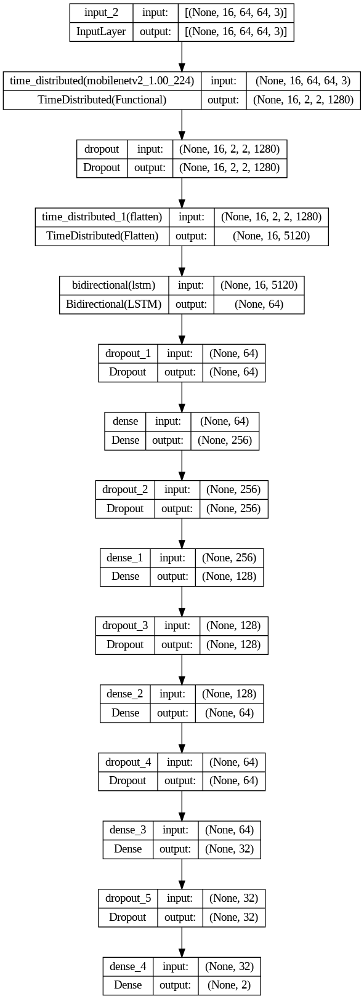

In [ ]:
# Constructing the Model
MoBiLSTM_model = create_model()

# Plot the structure of the contructed LRCN model.
plot_model(MoBiLSTM_model, to_file = 'MobBiLSTM_model_structure_plot.png', show_shapes = True, show_layer_names = True)

In [ ]:
import tensorflow  as tf

## ***Configuring Callbacks and Model Training and Fitting***  

In [ ]:
# Create Early Stopping Callback to monitor the accuracy
early_stopping_callback = EarlyStopping(monitor = 'val_accuracy', patience = 10, restore_best_weights = True)

# # Create ReduceLROnPlateau Callback to reduce overfitting by decreasing learning
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss',
                                                  factor=0.5,
                                                  patience=5,
                                                  min_lr=0.00005,
                                                  verbose=1)

# Compiling the model
MoBiLSTM_model.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ["accuracy"])

# Fitting the model
MobBiLSTM_model_history = MoBiLSTM_model.fit(x = features_train, y = labels_train, epochs = 50, batch_size = 8 ,
                                             shuffle = True, validation_split = 0.2, callbacks = [early_stopping_callback,reduce_lr])

Epoch 1/50
158/158 [==============================] - 39s 92ms/step - loss: 0.6284 - accuracy: 0.6487 - val_loss: 0.5114 - val_accuracy: 0.7595 - lr: 0.0010
Epoch 2/50
158/158 [==============================] - 10s 63ms/step - loss: 0.4763 - accuracy: 0.7975 - val_loss: 0.8904 - val_accuracy: 0.5981 - lr: 0.0010
Epoch 3/50
158/158 [==============================] - 9s 58ms/step - loss: 0.4298 - accuracy: 0.8188 - val_loss: 0.8454 - val_accuracy: 0.7373 - lr: 0.0010
Epoch 4/50
158/158 [==============================] - 10s 64ms/step - loss: 0.3686 - accuracy: 0.8592 - val_loss: 0.6265 - val_accuracy: 0.7785 - lr: 0.0010
Epoch 5/50
158/158 [==============================] - 10s 61ms/step - loss: 0.3766 - accuracy: 0.8378 - val_loss: 0.4570 - val_accuracy: 0.8291 - lr: 0.0010
Epoch 6/50
158/158 [==============================] - 10s 64ms/step - loss: 0.2911 - accuracy: 0.8916 - val_loss: 0.3188 - val_accuracy: 0.8576 - lr: 0.0010
Epoch 7/50
158/158 [==============================] - 9s 60

In [ ]:
_model_evaluation_history = MoBiLSTM_model.evaluate(features_test, labels_test)

## ***Model Evaluation and Plots***

In [ ]:
def plot_metric(model_training_history, metric_name_1, metric_name_2, plot_name):

    metric_value_1 = model_training_history.history[metric_name_1]
    metric_value_2 = model_training_history.history[metric_name_2]

    # Get the Epochs Count
    epochs = range(len(metric_value_1))

    plt.plot(epochs, metric_value_1, 'blue', label = metric_name_1)
    plt.plot(epochs, metric_value_2, 'orange', label = metric_name_2)

    plt.title(str(plot_name))

    plt.legend()

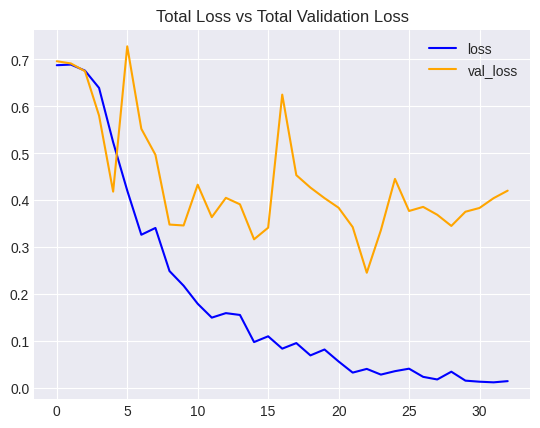

In [ ]:
plot_metric(MobBiLSTM_model_history, 'loss', 'val_loss', 'Total Loss vs Total Validation Loss')

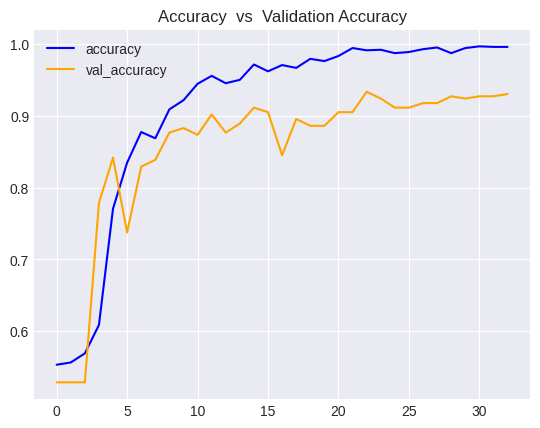

In [ ]:
plot_metric(MobBiLSTM_model_history, 'accuracy', 'val_accuracy', 'Accuracy  vs  Validation Accuracy')

In [ ]:
MoBiLSTM_model.save("Final_Trained_Model.h5")

In [ ]:
# Later, to load the model:
from tensorflow.keras.models import load_model

# Load the model
loaded_model = load_model("/content/drive/MyDrive/Models/Trained_model.h5")

In [ ]:
model_evaluation_history = loaded_model.evaluate(features_test, labels_test)

13/13 [==============================] - 7s 156ms/step - loss: 0.2296 - accuracy: 0.9494


In [ ]:
#loaded_model = MoBiLSTM_model

In [ ]:
labels_predict = loaded_model.predict(features_test)
# Decoding the data to use in Metrics
labels_predict = np.argmax(labels_predict , axis=1)
labels_test_normal = np.argmax(labels_test , axis=1)
labels_test_normal.shape , labels_predict.shape
labels_train_normal = np.argmax(labels_train , axis=1)

13/13 [==============================] - 3s 64ms/step


In [ ]:
from sklearn.metrics import accuracy_score
AccScore = accuracy_score(labels_predict, labels_test_normal)
print('Accuracy Score is : ', AccScore)

Accuracy Score is :  0.9493670886075949


## ***Confusion Matrix***

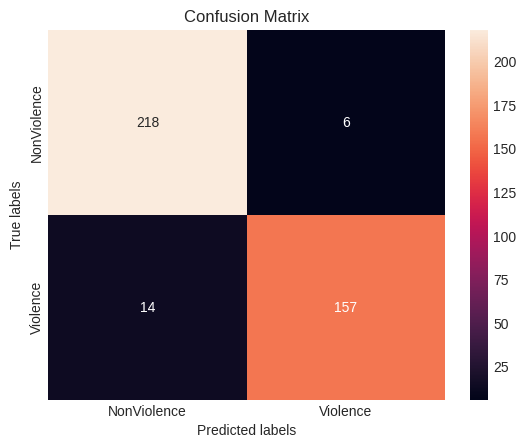

In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix

ax= plt.subplot()
cm=confusion_matrix(labels_test_normal, labels_predict)
sns.heatmap(cm, annot=True, fmt='g', ax=ax);

ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels');
ax.set_title('Confusion Matrix');
ax.xaxis.set_ticklabels(['NonViolence', 'Violence']); ax.yaxis.set_ticklabels(['NonViolence', 'Violence']);

## ***Classification Report***

In [ ]:
from sklearn.metrics import classification_report

ClassificationReport = classification_report(labels_test_normal,labels_predict)
print('Classification Report is : \n', ClassificationReport)

Classification Report is : 
               precision    recall  f1-score   support

           0       0.94      0.97      0.96       224
           1       0.96      0.92      0.94       171

    accuracy                           0.95       395
   macro avg       0.95      0.95      0.95       395
weighted avg       0.95      0.95      0.95       395



## ***Neuro-fuzzy Models for Classification***

In [ ]:
from keras.models import Model
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score

In [ ]:
# Get the output of the bidirectional LSTM layer
lstm_output = loaded_model.get_layer('bidirectional').output

# Create a feature extractor model
feature_extractor_model = Model(inputs=loaded_model.input, outputs=lstm_output)


In [ ]:
# Extract features from training and testing data
#features_test_extracted = feature_extractor_model.predict(features_test)
#features_train_extracted = feature_extractor_model.predict(features_train)

In [ ]:
#np.save("new_features_test_extracted_1.npy",features_test_extracted)
#np.save("new_features_train_extracted_1.npy",features_train_extracted)

In [ ]:
features_train_extracted = np.load("/content/drive/MyDrive/Features/features_train_extracted_1.npy")
features_test_extracted = np.load("/content/drive/MyDrive/Features/features_test_extracted_1.npy")

***SVM Classifier***

In [ ]:
# Train SVM classifier
svm_classifier = SVC(kernel='sigmoid')  # You can choose other kernels as well
svm_classifier.fit(features_train_extracted, labels_train_normal)


SVC(kernel='sigmoid')

In [ ]:
# Predict labels using SVM classifier
labels_predict_svm = svm_classifier.predict(features_test_extracted)

# Evaluate accuracy
accuracy_svm = accuracy_score(labels_test_normal, labels_predict_svm)
print('Accuracy Score using SVM classifier:', accuracy_svm)

Accuracy Score using SVM classifier: 0.9443037974683545


***Naive Bayse Classifier***

In [ ]:
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score
import numpy as np
# Train Naive Bayes classifier
nb_classifier = GaussianNB()
nb_classifier.fit(features_train_extracted, labels_train_normal)

GaussianNB()

In [ ]:
# Obtain predictions from the existing model
lstm_preds = loaded_model.predict(features_test)

# Obtain predictions from Naive Bayes classifier
nb_preds = nb_classifier.predict(features_test_extracted)

nb_preds_reshaped = np.expand_dims(nb_preds, axis=1)

accuracy_nb = nb_classifier.score(features_test_extracted, labels_test_normal)
print("Naive Bayse Accuracy:", accuracy_nb)

# Combine predictions (for example, using simple averaging)
combined_preds = (lstm_preds + nb_preds_reshaped) / 2

# Calculate accuracy of combined predictions
combined_accuracy = accuracy_score(np.argmax(labels_test, axis=1), np.argmax(combined_preds, axis=1))
print("Combined Model Accuracy:", combined_accuracy)

13/13 [==============================] - 1s 64ms/step
Naive Bayse Accuracy: 0.9443037974683545
Combined Model Accuracy: 0.9493670886075949


***Decision Tree Classifier***

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
# Train Decision Tree classifier
dt_classifier = DecisionTreeClassifier()
dt_classifier.fit(features_train_extracted, labels_train_normal)

DecisionTreeClassifier()

In [ ]:
accuracy_dt = dt_classifier.score(features_test_extracted, labels_test_normal)
dt_preds = dt_classifier.predict(features_test_extracted)
dt_preds_reshaped = np.expand_dims(dt_preds, axis=1)
print("Decision Tree Classifier Accuracy:", accuracy_dt)

# Combine predictions (for example, using simple averaging)
combined_preds = (lstm_preds + dt_preds_reshaped) / 2

# Calculate accuracy of combined predictions
combined_accuracy = accuracy_score(np.argmax(labels_test, axis=1), np.argmax(combined_preds, axis=1))
print("Combined Model Accuracy:", combined_accuracy)

Decision Tree Classifier Accuracy: 0.9367088607594937
Combined Model Accuracy: 0.9493670886075949


***Random Forest Classifier***

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Train Random Forest classifier
rf_classifier = RandomForestClassifier()
rf_classifier.fit(features_train_extracted, labels_train_normal)


RandomForestClassifier()

In [ ]:
# Evaluate Random Forest classifier
accuracy_rf = rf_classifier.score(features_test_extracted, labels_test_normal)
print("Random Forest Classifier Accuracy:", accuracy_rf)
# Obtain predictions from Random Forest classifier
rf_preds = rf_classifier.predict(features_test_extracted)
# Combine predictions (for example, using simple averaging)
combined_preds = (lstm_preds + rf_preds.reshape(-1, 1)) / 2
combined_accuracy = accuracy_score(np.argmax(labels_test, axis=1), np.argmax(combined_preds, axis=1))
print("Combined Model Accuracy:", combined_accuracy)

Random Forest Classifier Accuracy: 0.9493670886075949
Combined Model Accuracy: 0.9493670886075949


In [ ]:
# Combine predictions (for example, using simple averaging)
combined_preds = (lstm_preds + nb_preds.reshape(-1, 1) + rf_preds.reshape(-1, 1)+  dt_preds.reshape(-1, 1)) / 4
# Calculate accuracy of combined predictions
combined_accuracy = accuracy_score(np.argmax(labels_test, axis=1), np.argmax(combined_preds, axis=1))
print("Combined Model Accuracy:", combined_accuracy)

Combined Model Accuracy: 0.9493670886075949


***KNN Classifier***

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

# Assuming you have features_train_extracted, labels_train_normal, X_test, y_test defined elsewhere

# Train KNN classifier
knn_classifier = KNeighborsClassifier(n_neighbors=2)  # You can adjust the number of neighbors as needed
knn_classifier.fit(features_train_extracted, labels_train_normal)

KNeighborsClassifier(n_neighbors=2)

In [ ]:
# Evaluate KNN classifier
accuracy_knn = knn_classifier.score(features_test_extracted, labels_test_normal)
print("KNN Classifier Accuracy:", accuracy_knn)

# Obtain predictions from KNN classifier
knn_preds = knn_classifier.predict(features_test_extracted)

# Combine predictions (for example, using simple averaging)
combined_preds = (lstm_preds + nb_preds.reshape(-1, 1) + knn_preds.reshape(-1, 1)) / 3

# Calculate accuracy of combined predictions
combined_accuracy = accuracy_score(np.argmax(labels_test, axis=1), np.argmax(combined_preds, axis=1))
print("Combined Model Accuracy:", combined_accuracy)

KNN Classifier Accuracy: 0.9493670886075949
Combined Model Accuracy: 0.9493670886075949


***Gradient Boosting Classifier***

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score

# Assuming you have features_train_extracted, labels_train_normal, X_test, y_test defined elsewhere

# Train Gradient Boosting classifier
gbm_classifier = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=3)
gbm_classifier.fit(features_train_extracted, labels_train_normal)



GradientBoostingClassifier()

In [ ]:
# Evaluate Gradient Boosting classifier
accuracy_gbm = gbm_classifier.score(features_test_extracted, labels_test_normal)
print("Gradient Boosting Classifier Accuracy:", accuracy_gbm)

# Obtain predictions from Gradient Boosting classifier
gbm_preds = gbm_classifier.predict(features_test_extracted)

# Combine predictions (for example, using simple averaging)
combined_preds = (lstm_preds + nb_preds.reshape(-1, 1) + gbm_preds.reshape(-1, 1)) / 3

# Calculate accuracy of combined predictions
combined_accuracy = accuracy_score(np.argmax(labels_test, axis=1), np.argmax(combined_preds, axis=1))
print("Combined Model Accuracy:", combined_accuracy)

Gradient Boosting Classifier Accuracy: 0.9443037974683545
Combined Model Accuracy: 0.9493670886075949


*** AdaBoost Classifier***

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import accuracy_score



# Train AdaBoost classifier
adaboost_classifier = AdaBoostClassifier(n_estimators=100, learning_rate=1.0)
adaboost_classifier.fit(features_train_extracted, labels_train_normal)


AdaBoostClassifier(n_estimators=100)

In [ ]:
# Evaluate AdaBoost classifier
accuracy_adaboost = adaboost_classifier.score(features_test_extracted, labels_test_normal)
print("AdaBoost Classifier Accuracy:", accuracy_adaboost)

# Obtain predictions from AdaBoost classifier
adaboost_preds = adaboost_classifier.predict(features_test_extracted)

# Combine predictions (for example, using simple averaging)
combined_preds = (lstm_preds + nb_preds.reshape(-1, 1) + adaboost_preds.reshape(-1, 1)) / 3

# Calculate accuracy of combined predictions
combined_accuracy = accuracy_score(np.argmax(labels_test, axis=1), np.argmax(combined_preds, axis=1))
print("Combined Model Accuracy:", combined_accuracy)

AdaBoost Classifier Accuracy: 0.9493670886075949
Combined Model Accuracy: 0.9493670886075949


# ***Prediction Frame By Frame***

In [ ]:
# Later, to load the model:
from tensorflow.keras.models import load_model

# Load the model
loaded_model = load_model("/content/drive/MyDrive/Models/Trained_model.h5")

In [ ]:
labels_predict = loaded_model.predict(features_test)
# Decoding the data to use in Metrics
labels_predict = np.argmax(labels_predict , axis=1)
labels_test_normal = np.argmax(labels_test , axis=1)
labels_test_normal.shape , labels_predict.shape
labels_train_normal = np.argmax(labels_train , axis=1)

13/13 [==============================] - 4s 59ms/step


In [ ]:
import matplotlib.pyplot as plt

def predict_frames(video_file_path, output_file_path, SEQUENCE_LENGTH):

    # Read from the video file.
    video_reader = cv2.VideoCapture(video_file_path)

    # Get the width and height of the video.
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))

    # VideoWriter to store the output video in the disk.
    video_writer = cv2.VideoWriter(output_file_path, cv2.VideoWriter_fourcc('m', 'p', '4', 'v'),
                                    video_reader.get(cv2.CAP_PROP_FPS), (original_video_width, original_video_height))

    # Declare a queue to store video frames.
    frames_queue = deque(maxlen = SEQUENCE_LENGTH)

    # Store the predicted class in the video.
    predicted_class_name = ''

    # Iterate until the video is accessed successfully.
    while video_reader.isOpened():

        ok, frame = video_reader.read()

        if not ok:
            break

        # Resize the Frame to fixed Dimensions.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))

        # Normalize the resized frame
        normalized_frame = resized_frame / 255

        # Appending the pre-processed frame into the frames list.
        frames_queue.append(normalized_frame)

        # We Need at Least number of SEQUENCE_LENGTH Frames to perform a prediction.
        # Check if the number of frames in the queue are equal to the fixed sequence length.
        if len(frames_queue) == SEQUENCE_LENGTH:

            # Pass the normalized frames to the model and get the predicted probabilities.
            predicted_labels_probabilities = loaded_model.predict(np.expand_dims(frames_queue, axis = 0))[0]

            # Get the index of class with highest probability.
            predicted_label = np.argmax(predicted_labels_probabilities)

            # Get the class name using the retrieved index.
            predicted_class_name = CLASSES_LIST[predicted_label]

        # Write predicted class name on top of the frame.
        if predicted_class_name == "Violence":
            cv2.putText(frame, predicted_class_name, (5, 100), cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 0, 255), 12)
        else:
            cv2.putText(frame, predicted_class_name, (5, 100), cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 255, 0), 12)

        # Write The frame into the disk using the VideoWriter
        video_writer.write(frame)

    video_reader.release()
    video_writer.release()

In [ ]:
plt.style.use("default")

# To show Random Frames from the saved output predicted video (output predicted video doesn't show on the notebook but can be downloaded)
def show_pred_frames(pred_video_path):

    plt.figure(figsize=(20,20))

    video_reader = cv2.VideoCapture(pred_video_path)

    # Get the number of frames in the video.
    frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))

    # Get Random Frames from the video then Sort it
    random_range = sorted(random.sample(range (SEQUENCE_LENGTH , frames_count ), 12))

    for counter, random_index in enumerate(random_range, 1):

        plt.subplot(5, 4, counter)

        # Set the current frame position of the video.
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, random_index)

        ok, frame = video_reader.read()

        if not ok:
          break

        frame = cv2.cvtColor(frame , cv2.COLOR_BGR2RGB)

        plt.imshow(frame);ax.figure.set_size_inches(20,20);plt.tight_layout()

    video_reader.release()

In [ ]:
import os

# Construct the output video directory path.
output_video_directory = '/content/drive/MyDrive/Output_Videos'
os.makedirs(output_video_directory, exist_ok=True)

# Construct the output video file path.
output_video_file_path = os.path.join(output_video_directory, 'Output-Test-Video.mp4')

1/1 [==============================] - 0s 44ms/step


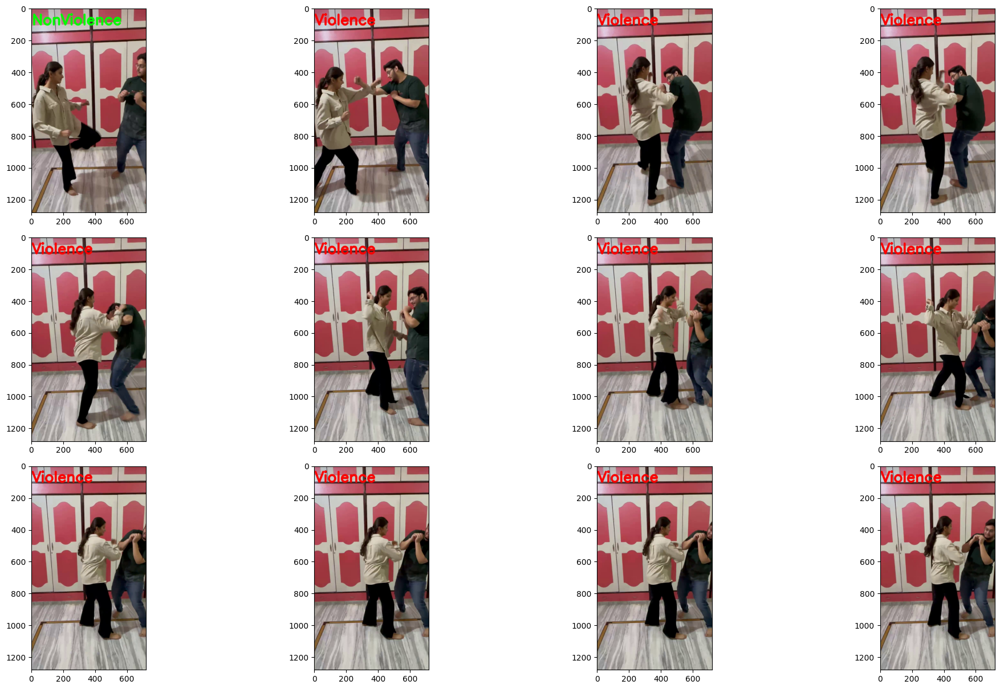

In [ ]:
# Specifying video to be predicted
input_video_file_path = "//content/drive/MyDrive/Testing_Videos/Test_V1.mp4"

# Perform Prediction on the Test Video.
predict_frames(input_video_file_path, output_video_file_path, SEQUENCE_LENGTH)

# Show random frames from the output video
show_pred_frames(output_video_file_path)

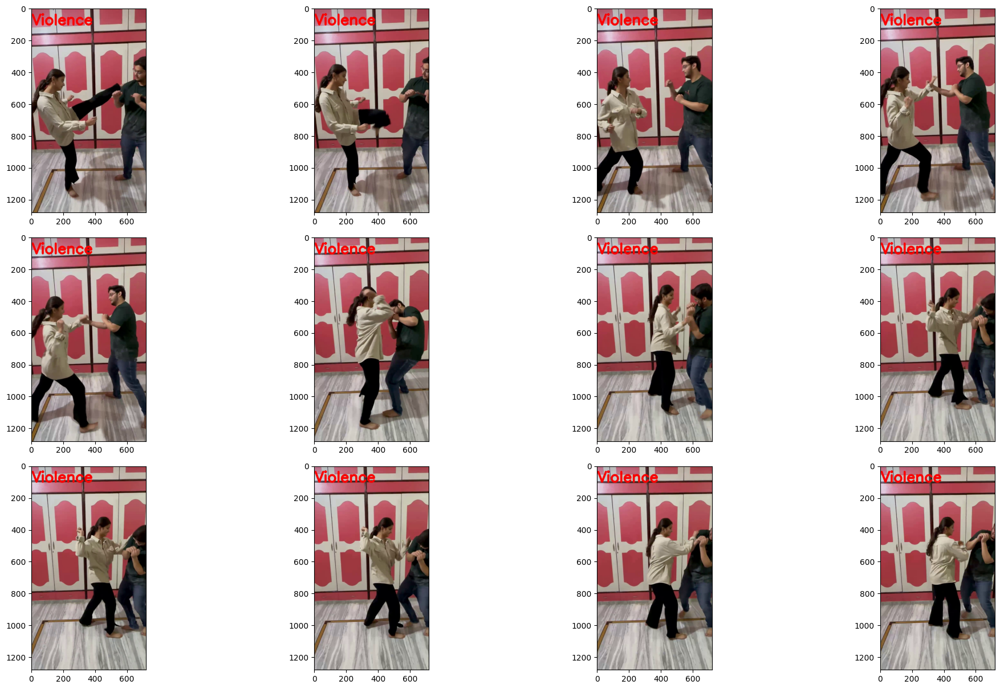

In [ ]:
# Specifying video to be predicted
input_video_file_path =  "/content/drive/MyDrive/Project_Dataset/NonViolence/Try_V_Vishal.mp4"

# Perform Prediction on the Test Video.
predict_frames(input_video_file_path, output_video_file_path, SEQUENCE_LENGTH)

# Show random frames from the output video
show_pred_frames(output_video_file_path)

1/1 [==============================] - 0s 24ms/step


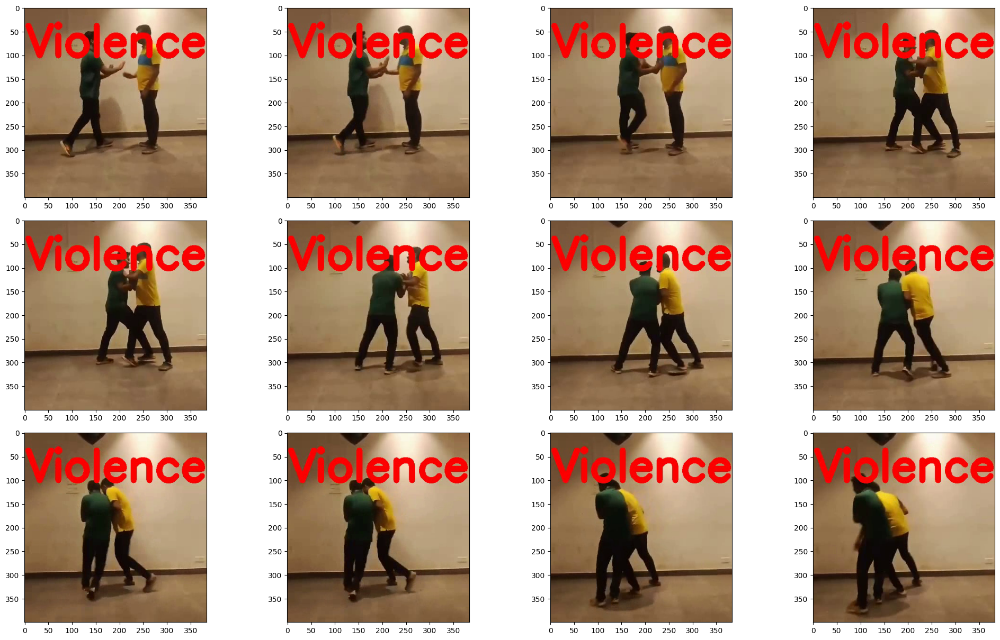

In [ ]:
# Specifying video to be predicted
input_video_file_path =  "/content/WhatsApp Video 2024-05-04 at 12.46.44 PM.mp4"

# Perform Prediction on the Test Video.
predict_frames(input_video_file_path, output_video_file_path, SEQUENCE_LENGTH)

# Show random frames from the output video
show_pred_frames(output_video_file_path)

# ***Video Prediction***

In [ ]:
def predict_video(video_file_path, SEQUENCE_LENGTH):

    video_reader = cv2.VideoCapture(video_file_path)

    # Get the width and height of the video.
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))

    # Declare a list to store video frames we will extract.
    frames_list = []

    # Store the predicted class in the video.
    predicted_class_name = ''

    # Get the number of frames in the video.
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))

    # Calculate the interval after which frames will be added to the list.
    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH),1)

    # Iterating the number of times equal to the fixed length of sequence.
    for frame_counter in range(SEQUENCE_LENGTH):

        # Set the current frame position of the video.
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)

        success, frame = video_reader.read()

        if not success:
            break

        # Resize the Frame to fixed Dimensions.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))

        # Normalize the resized frame.
        normalized_frame = resized_frame / 255

        # Appending the pre-processed frame into the frames list
        frames_list.append(normalized_frame)

    # Passing the  pre-processed frames to the model and get the predicted probabilities.
    predicted_labels_probabilities = loaded_model.predict(np.expand_dims(frames_list, axis = 0))[0]

    # Get the index of class with highest probability.
    predicted_label = np.argmax(predicted_labels_probabilities)

    # Get the class name using the retrieved index.
    predicted_class_name = CLASSES_LIST[predicted_label]

    # Display the predicted class along with the prediction confidence.
    print(f'Predicted: {predicted_class_name}\nConfidence: {predicted_labels_probabilities[predicted_label]}')

    video_reader.release()

In [ ]:
# Specifying video to be predicted
input_video_file_path = "/content/drive/MyDrive/Testing_Videos/Test_V2.mp4"

# Perform Single Prediction on the Test Video.
predict_video(input_video_file_path, SEQUENCE_LENGTH)

# Play the actual video
Play_Video(input_video_file_path  )

1/1 [==============================] - 0s 25ms/step
Predicted: Violence
Confidence: 0.9805672764778137


In [ ]:
# Specifying video to be predicted
input_video_file_path = "/content/drive/MyDrive/Testing_Videos/Test_NV_All.mp4"

# Perform Single Prediction on the Test Video.
predict_video(input_video_file_path, SEQUENCE_LENGTH)

# Play the actual video
Play_Video(input_video_file_path)

1/1 [==============================] - 0s 26ms/step
Predicted: NonViolence
Confidence: 0.9917797446250916
